# Motivation

Motivation for this project is to examine the possibilities geospatial python packages offer. For that we want to display the areas, which have the best electric car charger stations coverage within the state of Mecklenburg-Vorpommern.
 - Section I: An interactive map for python - folium
 - Section II: Working with street networks - networkx and OSMnx
 - Section III: Effective coverage of charging stations

In [44]:
#Goal output
m

# Section I: An interactive map for python - folium

In [1]:
#Importing packages
import pandas as pd
import json
import numpy as np
import time

#Geospatial packages
import geopandas as gpd
import folium
import networkx as nx
import osmnx as ox

#Plotting packages
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
#With the folium package creating interactive maps in python is pretty easy
#Folium gets it mapping strengths from the JavaScript library Leaflet
#You can manipulate your data in Python and then visualize it in on a Leaflet map via folium
m = folium.Map([53.9, 12.504138], zoom_start=8)
m

## Mecklenburg zipcode area overlayer

For later aggregation purposes, we will use zipcode areas. This has the additional advantage, that many statistics available are also tied to the zipcode and can easily be linked to our data.

In [3]:
#Source: https://www.suche-postleitzahl.org/downloads [28.07.2020]
fname = '../Data/plz-5stellig.geojson'
df_zip_germany = gpd.read_file(fname)

In [4]:
df_zip_germany.head(5)

,plz,note,qkm,einwohner,geometry
0,01067,01067 Dresden,6.866862,11957,"POLYGON ((13.68689 51.06395, 13.69570 51.06499..."
1,01069,01069 Dresden,5.352996,25491,"MULTIPOLYGON (((13.72635 51.02186, 13.73031 51..."
2,01097,01097 Dresden,3.276896,14811,"POLYGON ((13.72548 51.06860, 13.72629 51.06900..."
3,01099,01099 Dresden,58.500502,28021,"POLYGON ((13.74218 51.08979, 13.74335 51.08863..."
4,01108,01108 Dresden,16.447222,5876,"POLYGON ((13.76543 51.17491, 13.76637 51.17469..."


Reducing zipcodes to only contain Mecklenburg-Vorpommern

In [5]:
#Source: https://www.suche-postleitzahl.org/downloads [28.07.2020]
df_zip_state = pd.read_excel(r'..\Data\Deutschland-Postleitzahlen.xlsx')

In [6]:
df_zip_state.head(5)

,PLZ,Bundesland,Kreis,Typ
0,1067,Sachsen,Dresden,Stadt
1,1069,Sachsen,Dresden,Stadt
2,1097,Sachsen,Dresden,Stadt
3,1099,Sachsen,Dresden,Stadt
4,1108,Sachsen,Dresden,Stadt


In [7]:
#Reducing states to only contain zipcodes, which also occur in the state of Mecklenburg-Vorpommern
df_zip_state = df_zip_state[df_zip_state['Bundesland'] == 'Mecklenburg-Vorpommern']

In [9]:
lst_drop = []
for i in range (len(df_zip_germany)):
    if sum(df_zip_state['PLZ'] == int(df_zip_germany['plz'][i])) == 0 :
        lst_drop.append(i)

In [10]:
#GeoJson of the geomatry of zipcode zones only for Mecklenburg-Vorpommern zipcodes
df_zip_meckpom = df_zip_germany.drop(df_zip_germany.index[lst_drop])

In [11]:
m = folium.Map([53.9, 12.504138], zoom_start=8, tiles='stamentoner')
folium.GeoJson(df_zip_meckpom).add_to(m)
m

## Import charging station data and add column "population/charger" to the DataFrame

In [12]:
#Import data
df_charger = pd.read_excel(r'..\Data\data_charger_v3.xlsx')

Source: https://www.enbw.com/elektromobilitaet/produkte/mobilityplus-app/ladestation-finden [28.07.2020]
<br>The charging station data has been collected through the recording ability of the chrome browser of the network log and saving the log as a .har file. Edited, enhanced and saved as an excel file to be easily loaded.

In [13]:
df_charger.head()

,stationId,operator,lat,lon,numberOfChargePoints,availableChargePoints,maxPowerInKw,plugTypes,authenticationMethods,zipcode,state,county,population
0,133620,xxx,53.800347,12.200060,1,1,26.60,['TYPE_2'],xxx,18273,Mecklenburg-Vorpommern,Landkreis Rostock,28907
1,127248,xxx,53.893713,11.474260,4,4,26.60,['TYPE_2'],xxx,23970,Mecklenburg-Vorpommern,Nordwestmecklenburg,11227
2,126860,xxx,53.889900,11.469300,3,3,0.00,"['TYPE_2', 'CHADEMO', 'CCS']",xxx,23966,Mecklenburg-Vorpommern,Nordwestmecklenburg,20772
3,106294,xxx,53.852273,11.457002,3,3,52.38,"['CHADEMO', 'CCS', 'TYPE_2']",xxx,23972,Mecklenburg-Vorpommern,Nordwestmecklenburg,5418
4,126859,xxx,53.897913,11.461625,2,0,0.00,['TYPE_2'],xxx,23966,Mecklenburg-Vorpommern,Nordwestmecklenburg,20772


In [14]:
#Computing the population per charger station available within a zipcode area
lst_charger_plz = []
for i in range (len(df_charger)):
    #charger station within a zipcode 
    summe = df_charger[df_charger['zipcode'] == df_charger['zipcode'][i]]['numberOfChargePoints'].sum()
    #population per charger station
    pop_charger = df_charger['population'][i] / summe
    #adding zipcode as a string, this is necessary since the zipcode data saved in the geojson file is also type string
    zip_str = str(df_charger['zipcode'][i])
    lst_charger_plz.append([df_charger['stationId'][i], summe , pop_charger, zip_str])

In [15]:
df_add = pd.DataFrame(lst_charger_plz, columns=(['stationId', 'nb_charger_zip', 'pop_charger', 'zip_str']))

In [16]:
df_charger = df_charger.merge(df_add, on = 'stationId')

In [17]:
df_charger.head()

,stationId,operator,lat,lon,numberOfChargePoints,availableChargePoints,maxPowerInKw,plugTypes,authenticationMethods,zipcode,state,county,population,nb_charger_zip,pop_charger,zip_str
0,133620,xxx,53.800347,12.200060,1,1,26.60,['TYPE_2'],xxx,18273,Mecklenburg-Vorpommern,Landkreis Rostock,28907,1,28907.00,18273
1,127248,xxx,53.893713,11.474260,4,4,26.60,['TYPE_2'],xxx,23970,Mecklenburg-Vorpommern,Nordwestmecklenburg,11227,4,2806.75,23970
2,126860,xxx,53.889900,11.469300,3,3,0.00,"['TYPE_2', 'CHADEMO', 'CCS']",xxx,23966,Mecklenburg-Vorpommern,Nordwestmecklenburg,20772,5,4154.40,23966
3,106294,xxx,53.852273,11.457002,3,3,52.38,"['CHADEMO', 'CCS', 'TYPE_2']",xxx,23972,Mecklenburg-Vorpommern,Nordwestmecklenburg,5418,3,1806.00,23972
4,126859,xxx,53.897913,11.461625,2,0,0.00,['TYPE_2'],xxx,23966,Mecklenburg-Vorpommern,Nordwestmecklenburg,20772,5,4154.40,23966


Distribution pop/charger

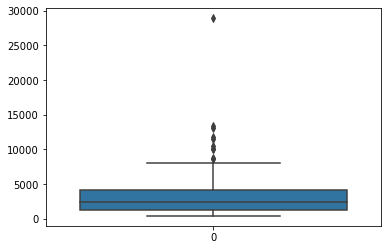

In [18]:
ax = sns.boxplot(data=df_charger['pop_charger'])

In [19]:
#Compute outlier with 0.95 percentile
p95 = np.percentile(df_charger['pop_charger'], 95)

In [20]:
df_charger[df_charger['pop_charger'] >= p95]

,stationId,operator,lat,lon,numberOfChargePoints,availableChargePoints,maxPowerInKw,plugTypes,authenticationMethods,zipcode,state,county,population,nb_charger_zip,pop_charger,zip_str
0,133620,xxx,53.800347,12.200060,1,1,26.6,['TYPE_2'],xxx,18273,Mecklenburg-Vorpommern,Landkreis Rostock,28907,1,28907.0,18273
24,142701,xxx,53.906375,13.030489,1,0,26.6,['TYPE_2'],xxx,17109,Mecklenburg-Vorpommern,Mecklenburgische Seenplatte,11750,1,11750.0,17109
29,121460,xxx,54.096150,13.447445,1,1,7.0,['TYPE_2'],xxx,17493,Mecklenburg-Vorpommern,Vorpommern-Greifswald,10128,1,10128.0,17493
48,103682,xxx,54.155269,12.015609,2,1,26.6,['TYPE_2'],xxx,18107,Mecklenburg-Vorpommern,Landkreis Rostock,20869,2,10434.5,18107
51,91095,xxx,54.138578,12.074564,2,0,0.0,['TYPE_2'],xxx,18106,Mecklenburg-Vorpommern,Rostock,22925,2,11462.5,18106
64,128326,xxx,54.076684,12.120305,2,2,0.0,['TYPE_2'],xxx,18059,Mecklenburg-Vorpommern,Rostock,26760,2,13380.0,18059
115,138682,xxx,53.851830,13.691240,1,0,22.0,['TYPE_2'],xxx,17389,Mecklenburg-Vorpommern,Vorpommern-Greifswald,13107,1,13107.0,17389


The worst ratio of people to available charging stations can be found in 18273 Güstrow, which would be a prime candidate to have additional charging stations installed.

In [21]:
m = folium.Map([53.9, 12.504138], zoom_start=8)

In [22]:
folium.Choropleth(
    geo_data=df_zip_meckpom,
    name='choropleth',
    data=df_charger,
    columns=['zip_str', 'pop_charger'],
    key_on='properties.plz',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Population/Charger'
).add_to(m)

folium.LayerControl().add_to(m)

In [23]:
#Plot folium map with population per charger
m

# Section II: Working with street networks - networkx and OSMnx

OSMnx by Geoff Boeing is a great free python package, which we will use to compute and display the coverage of charging station using only the street network but it entails much more capabilities:
 - Automated downloading of political boundaries and building footprints.
 - Tailored and automated downloading and constructing of street network data from OpenStreetMap.
 - Algorithmic correction of network topology.
 - Ability to save street networks to disk as shapefiles, GraphML, or SVG files.
 - Ability to analyze street networks, including calculating routes, projecting and visualizing networks, and calculating metric and topological measures.
 

**Citation**: Boeing, G. 2017. “OSMnx: New Methods for Acquiring, Constructing, Analyzing, and Visualizing Complex Street Networks.” Computers, Environment and Urban Systems. 65, 126-139. <p>
    
https://geoffboeing.com/ [28.07.2020]

In [24]:
#using the street network, how far can you reach by only driving 5km in each direction
loc_stationId_133318 = (53.64722, 11.348748)
dictance = 5000 # in meters

g = ox.graph_from_point(loc_stationId_133318, dist=dictance, dist_type='network', network_type='drive')

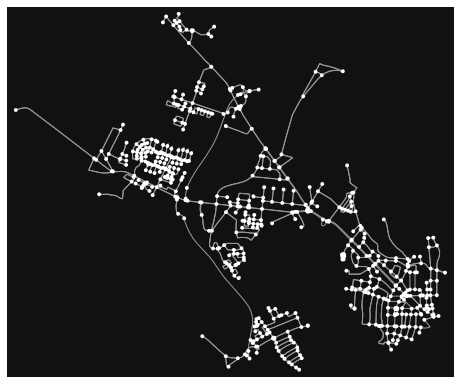

(<Figure size 576x576 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1701053cd00>)

In [25]:
ox.plot_graph(g)

In [26]:
#Plot the new folium map
m_g = ox.plot_graph_folium(g, edge_color='#FEE12B', tiles='stamentoner')

#Add a marker for the location of the charging station
tooltip = 'Information'
folium.Marker(loc_stationId_133318, popup='<i>StationId 133318</i>', tooltip=tooltip).add_to(m_g)

In [27]:
m_g

### Number of nodes within a zipcode area

With the total number of nodes within a zipcode and the number of nodes a specific charging station can reach, we can compute the coverage of nodes a given charging station can have. <p> Example: The zipcode 17033 has 2000 nodes. A charging station with a given reach of 5km can cover 1400 of the nodes in the zipcode. The charger has a coverage of 70% in the zipcode area.

In [28]:
#Import data
df_nodes_in_zipcode = pd.read_excel(r'..\Data\df_nodes_in_zipcode.xlsx')

In [29]:
df_nodes_in_zipcode.head()

,zip,node
0,17033,1482686589
1,17033,1482686597
2,17033,1901071625
3,17033,5004857780
4,17033,1901072886


In [30]:
df_nodes_in_zipcode = df_nodes_in_zipcode.groupby('zip').count()
df_nodes_in_zipcode = df_nodes_in_zipcode.reset_index()

In [31]:
#add zipcode as string
lst_str_add = []
for i in range(len(df_nodes_in_zipcode)):
    lst_str_add.append(str(df_nodes_in_zipcode['zip'][i]))
    
df_nodes_in_zipcode['zip_str'] = lst_str_add

In [32]:
m = folium.Map([53.9, 12.504138], zoom_start=8)

In [33]:
folium.Choropleth(
    geo_data=df_zip_meckpom,
    name='choropleth_1',
    data=df_nodes_in_zipcode,
    columns=['zip_str', 'node'],
    key_on='properties.plz',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Nodes in Zipcode'
).add_to(m)

folium.LayerControl().add_to(m)

In [34]:
m

# Section III: Effective coverage of charging stations

In the following section we want to plot the area a charging station can cover but we will make two adjustments: <br>
<p>
 - Firstly: To improve the speed of the computation, we will reduce the number of charging stations, from which we would have to compute the street coverage. We will bunch together all charging stations within a zipcode and depending of the number of charging station compute a aggregated charging station location. 
<br>
 - Secondly: We will bring in the population within a zipcode and link it directly to the effective reach a charging station can have.

In [35]:
def get_zip_coor (df, zipcode):
    #Depending on the number of charging station within a zipcode "get_zip_coor" computes the coordinates of
    #a new location
    
    #Import Packages
    import pandas as pd
    from shapely.geometry import Polygon
    import numpy as np
    
    df = df[df['zipcode'] == zipcode]
    
    #One charging stations --> Point
    if len(df) == 1:
        center = [df.iloc[0,2], df.iloc[0,3]]
        
    #Two charging stations --> Line
    if len(df) == 2:
        lat = list(df['lat'])
        lon = list(df['lon'])
        center = [np.mean(lat), np.mean(lon)] #not exactly correct, but for the moment sufficient    
    
    #Three or more charging stations -- >Polygon
    if len(df) >= 3:
        lat = list(df['lat'])
        lon = list(df['lon'])
        coordinates = list(zip(lat,lon))
        poly = Polygon(coordinates)
        center = [poly.centroid.x,poly.centroid.y]
    
    return center

We will reduce the reach a charging station can have. The initial restrictions are pretty harsh but with that the computation speed increases and a quick feedback concerning the usability of the model can be given. <p>
 - Multiplication of the population in zipcode with an assumptive percentage of user within that population
 - 50 000 people total * 0.03 = 1500 electric car users
 - electric car users/charger available in zipcode
 - base reach is 10 km
 - depending on the users/charger proportion an additional reach is added
 - 25 person/charging station --> bonus range = 50km
 - 125 person/charging station --> bonus range = 0km

In [36]:
#To be save, we make a copy of the original data set
df_eff_reach = df_nodes_in_zipcode.copy(deep=True)
df_eff_reach['eff_reach'] = 0
#assumptive percentage of population owning an electric car
usage = 0.03 
zip_unique = df_charger['zipcode'].unique()

for p in range(len(zip_unique)):
    start_time = time.time()
    print('In process: ' + str(p+1) + ' of ' + str(len(zip_unique)))
    
    loc_cs = get_zip_coor(df_charger, zipcode = zip_unique[p])
    
    #calculate effective reach
    ecar_user =  df_charger[df_charger['zipcode'] == zip_unique[p]]['pop_charger'].mean() * usage
    bonus = max(0, ecar_user - 25)
    #Usage at or above 125 person/charging station --> bonus range = 0km
    #Usage at or below 25 person/charging station --> bonus range = 50km
    bonus = 50 * ((100 - bonus) / 100)
    if bonus < 0: bonus = 0
    if bonus > 50: bonus = 50
    #min effective range = 10, max effective range = 60
    effective_reach = int( (10+ bonus)*1000)
    print('User: ' + str(int(ecar_user)))
    print('Effective reach in km: ' + str(effective_reach/1000))
    
    #compute street network with given effective reach
    nx_cs = ox.graph_from_point(loc_cs , dist=effective_reach, dist_type='network', network_type='drive')
    lst_nx_cs = list(nx_cs.nodes())
    for i in range(len(lst_nx_cs)):
        idx = df_eff_reach.index[df_eff_reach['node'] == lst_nx_cs[i]]
        if len(idx) != 0:
            df_eff_reach.iloc[idx[0],2] += 1
    elapsed_time = time.time() - start_time
    print('Elapsed time in seconds: ' + str(int(elapsed_time)))
    print('----------------------------------------------------')

In process: 1 of 73
User: 867
Effective reach in km: 10.0
Elapsed time in seconds: 9
----------------------------------------------------
In process: 2 of 73
User: 84
Effective reach in km: 30.398
Elapsed time in seconds: 109
----------------------------------------------------
In process: 3 of 73
User: 124
Effective reach in km: 10.184
Elapsed time in seconds: 14
----------------------------------------------------


In [37]:
#importing result
df_eff_reach = pd.read_excel(r'..\Data\df_eff_reach.xlsx')

In [38]:
#remove node column
df_eff_reach.pop('node')

0         1482686589
1         1482686597
2         1901071625
3         5004857780
4         1901072886
             ...    
344568     411039531
344569     411039533
344570     411039534
344571     411039535
344572     411039542
Name: node, Length: 344573, dtype: int64

In [39]:
#compute nodes within a zipcode
df_eff_reach = df_eff_reach.groupby('zip').sum() #.sum() instead of .count(), number of instances is important
df_eff_reach = df_eff_reach.reset_index()

In [40]:
#create a copy
df_nodes_copy = df_nodes_in_zipcode.copy(deep=True)

In [41]:
#adding zipcode as a string, this is necessary since the zipcode data saved in the geojson file is also type string
lst_add = []
for i in range(len(df_nodes_copy)):
    if len(df_eff_reach[df_eff_reach['zip'] == df_nodes_copy['zip'][i]]) > 0:
        sum_nodes = df_eff_reach[df_eff_reach['zip'] == df_nodes_copy['zip'][i]].iloc[0,1]        
    else:
        sum_nodes = 0
    lst_add.append([df_nodes_copy['zip'][i], sum_nodes, sum_nodes/df_nodes_copy['node'][i]])

In [42]:
df_add = pd.DataFrame(lst_add, columns=['zip', 'reach', 'reach_node_coverage'])
df_nodes_copy = df_nodes_copy.merge(df_add, on=['zip'])

In [43]:
m = folium.Map([53.9, 12.504138], zoom_start=8)

folium.Choropleth(
    geo_data=df_zip_meckpom,
    name='choropleth',
    data=df_nodes_copy,
    columns=['zip_str', 'reach_node_coverage'],
    key_on='properties.plz',
    fill_color='PuBuGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='node coverage of effective reach'
).add_to(m)

folium.LayerControl().add_to(m)

m

### Findings:
- Areas alongside the coast have the best charging station coverage.
- This also routes from the limitation of the analysis itself, to the state Mecklenburg-Vorpommern. So the charging stations in adjacent states (for example Lübeck has a lot of charging stations) are not taken into account.
- The factors limiting the effective reach are initial pretty harsh set. Increasing them would increase the covered area and can be done in subsequent analyses.
- From the population/charger ratio we can conclude the top three zipcode areas for additional charging stations are:
 - 18273 Güstrow, 17109 Demmin, 17493 Greifswald